# TC 5033
## Deep Learning
## Convolutional Neural Networks
<br>

#### Activity 2b: Building a CNN for CIFAR10 dataset with PyTorch
<br>

- Objective

    The main goal of this activity is to further your understanding of Convolutional Neural Networks (CNNs) by building one using PyTorch. You will apply this architecture to the famous CIFAR10 dataset, taking what you've learned from the guide code that replicated the Fully Connected model in PyTorch (Activity 2a).

- Instructions
    This activity requires submission in teams of 5 or 6 members. Submissions from smaller or larger teams will not be accepted unless prior approval has been granted (only due to exceptional circumstances). While teamwork is encouraged, each member is expected to contribute individually to the assignment. The final submission should feature the best arguments and solutions from each team member. Only one person per team needs to submit the completed work, but it is imperative that the names of all team members are listed in a Markdown cell at the very beginning of the notebook (either the first or second cell). Failure to include all team member names will result in the grade being awarded solely to the individual who submitted the assignment, with zero points given to other team members (no exceptions will be made to this rule).

    Understand the Guide Code: Review the guide code from Activity 2a that implemented a Fully Connected model in PyTorch. Note how PyTorch makes it easier to implement neural networks.

    Familiarize Yourself with CNNs: Take some time to understand their architecture and the rationale behind using convolutional layers.

    Prepare the Dataset: Use PyTorch's DataLoader to manage the dataset. Make sure the data is appropriately preprocessed for a CNN.

    Design the CNN Architecture: Create a new architecture that incorporates convolutional layers. Use PyTorch modules like nn.Conv2d, nn.MaxPool2d, and others to build your network.

    Training Loop and Backpropagation: Implement the training loop, leveraging PyTorch’s autograd for backpropagation. Keep track of relevant performance metrics.

    Analyze and Document: Use Markdown cells to explain your architectural decisions, performance results, and any challenges you faced. Compare this model with your previous Fully Connected model in terms of performance and efficiency.

- Evaluation Criteria

    - Understanding of CNN architecture and its application to the CIFAR10 dataset
    - Code Readability and Comments
    - Appropriateness and efficiency of the chosen CNN architecture
    - Correct implementation of Traning Loop and Accuracy Function
    - Model's performance metrics on the CIFAR10 dataset (at least 65% accuracy)
    - Quality of Markdown documentation

- Submission

Submit via Canvas your Jupyter Notebook with the CNN implemented in PyTorch. Your submission should include well-commented code and Markdown cells that provide a comprehensive view of your design decisions, performance metrics, and learnings.

## Team 9

* Jessica Giovana García Gómez: A01795922
* Alejandro González Almazán: A00517113
* Esteban Sebastián Guerra Espinoza: A01795897
* Jossie Paola Jiménez Rivera: A01795961
* Paúl Andrés Yungán Pinduisaca: A01795702

In [ ]:
import numpy as np # Used for working with multidimensional arrays and mathematical operations
import torch #PyTorch deep learning framework
import torch.nn as nn #For building and training neural networks
import torch.nn.functional as F #For cross_entropy
from torch.utils.data import DataLoader #Load datasets in batches
from torch.utils.data import sampler #Defines strategy of sampling, like random
import torchvision.datasets as datasets #datasets dor training and evaluating the model
import torchvision.transforms as T #Convert tensors, normalize and compose
import matplotlib.pyplot as plt # For data visualization
#only if you have jupyterthemes, this generates graphs within the Jupyterthemes color scheme
from jupyterthemes import jtplot
jtplot.style() # Apply the current Jupyter theme to Matplotlib plots

import time  # For time performance calculation
import os  # Used to handle file paths, directories, etc.
import pandas as pd  # For data analysis

#Steps required to open google drive
from google.colab import drive

In [ ]:
#Open current directory
cwd = os. getcwd()

#open drive
drive.mount('/content/drive')

### Download Cifar10 dataset

The CIFAR-10 dataset consists of 60,000 color images, each 32x32 pixels, spread across 10 categories: airplanes, cars, birds, cats, deer, dogs, frogs, horses, ships, and trucks. Each class has 6,000 images, with 50,000 used for training and 10,000 for testing. It's a well-balanced dataset and a go-to choice in the computer vision community for training and evaluating image classification models.  

What makes CIFAR-10 interesting is the diversity in its images—different lighting conditions, angles, and backgrounds add complexity to the task. Even though it's relatively small compared to other modern datasets, it remains a popular benchmark for testing CNN architectures and experimenting with techniques like data augmentation and regularization to improve model performance.

In [ ]:
#Check if a GPU/CUDA is available for computation on the machine.
torch.cuda.is_available()

True

In [ ]:
"""-------------------------------------------------------------------

There are small images of 32*32 pixels, each one belongs to 1 of 10 classes:
Plane, car, bird, cat, deer, dog, frog, horse, boat and truck.

-------------------------------------------------------------------"""

DATA_PATH = cwd + '/cifar-10-python.tar' #Image repository
NUM_TRAIN = 50000 #Training Set
NUM_VAL = 5000 #Validation Set
NUM_TEST = 5000 #Test set
MINIBATCH_SIZE = 64

#Compose a series of transformations, allows to make transformations to the images, modifications such as rotations, in this case it is used to convert to a tensor and normalize.
transform_cifar = T.Compose([
                T.ToTensor(),
                T.Normalize([0.491, 0.482, 0.447], [0.247, 0.243, 0.261])
            ])

#Train dataset: Group all the training data into an object and apply transformations
cifar10_train = datasets.CIFAR10(DATA_PATH, train=True, download=True,
                             transform=transform_cifar)
#Convert into a dataloader from datasets. Sampler to perform random sampling.
train_loader = DataLoader(cifar10_train, batch_size=MINIBATCH_SIZE,
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))
#Validation set
cifar10_val = datasets.CIFAR10(DATA_PATH, train=False, download=True,
                           transform=transform_cifar)
val_loader = DataLoader(cifar10_val, batch_size=MINIBATCH_SIZE,
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL)))
#Test set
cifar10_test = datasets.CIFAR10(DATA_PATH, train=False, download=True,
                            transform=transform_cifar)
test_loader = DataLoader(cifar10_test, batch_size=MINIBATCH_SIZE,
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL, len(cifar10_test))))

100.0%


In [ ]:
cifar10_train

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: c:\Users\jopaz\Documents\MNA\3. TC5033.10 Advanced Machine Learning Methods\2/cifar-10-python.tar
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=[0.491, 0.482, 0.447], std=[0.247, 0.243, 0.261])
           )

In [ ]:
train_loader.batch_size

64

In [ ]:
"""-------------------------------------------------------------------
Iterate over the training DataLoader
For each batch, extract the images (x) and their corresponding labels (y)
Print the values to verify that the data is being loaded correctly
X image
Y  label
-------------------------------------------------------------------"""
for i, (x, y) in enumerate(train_loader):
    print(x, y)

tensor([[[[ 2.9840e-01,  2.6665e-01,  1.0788e-01,  ...,  1.4733e+00,
            1.6162e+00,  1.8226e+00],
          [ 2.6665e-01,  2.9840e-01,  1.7139e-01,  ...,  1.0922e+00,
            1.4574e+00,  1.8385e+00],
          [ 3.3016e-01,  3.3016e-01,  1.3964e-01,  ...,  1.0129e+00,
            1.4098e+00,  1.8067e+00],
          ...,
          [-1.9561e+00, -1.7656e+00, -1.3528e+00,  ..., -3.2547e-03,
           -8.2639e-02, -1.3027e-01],
          [-1.9720e+00, -1.9720e+00, -1.8767e+00,  ...,  2.8499e-02,
           -6.6762e-02, -5.0885e-02],
          [-1.9561e+00, -1.9561e+00, -1.9879e+00,  ..., -1.6202e-01,
            7.6129e-02,  1.2622e-02]],

         [[-2.5676e-01, -2.8903e-01, -3.6972e-01,  ...,  1.2602e+00,
            1.4539e+00,  1.7282e+00],
          [-3.0517e-01, -2.8903e-01, -3.3745e-01,  ...,  9.2133e-01,
            1.3248e+00,  1.7605e+00],
          [-2.8903e-01, -2.8903e-01, -4.0200e-01,  ...,  7.7608e-01,
            1.1795e+00,  1.6153e+00],
          ...,
     

#### GPU

In [ ]:
"""
Check if a GPU is available for training.
If a GPU is available, set the device to 'cuda' (GPU), otherwise, use the CPU.
Print the selected device to confirm which one will be used for training.
"""

if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')
print(device)

cuda


### Mostrar imágenes

La imagen muestreada representa un: airplane


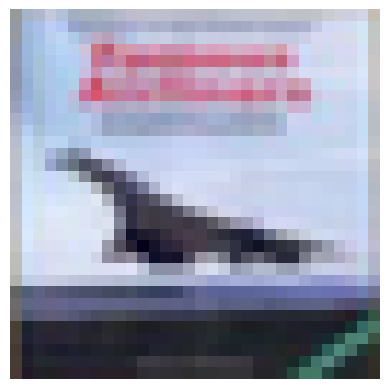

In [ ]:
"""
Obtain the list of class labels from the test dataset.
Define a function to plot an image, ensuring the correct color channel order (RGB) by transposing the image dimensions.
Randomly sample an index from the test dataset to select a random image.
Print the class label of the sampled image using the index to retrieve the corresponding class.
Normalize the image by scaling its pixel values to the range [0, 1].
Plot the normalized image using the previously defined function.
"""
classes = test_loader.dataset.classes
def plot_figure(image):
    plt.imshow(np.transpose(image,(1,2,0)))
    plt.axis('off')
    plt.show()

rnd_sample_idx = np.random.randint(len(test_loader))
print(f'La imagen muestreada representa un: {classes[test_loader.dataset[rnd_sample_idx][1]]}')
image = test_loader.dataset[rnd_sample_idx][0]
image = (image - image.min()) / (image.max() -image.min() )
plot_figure(image)


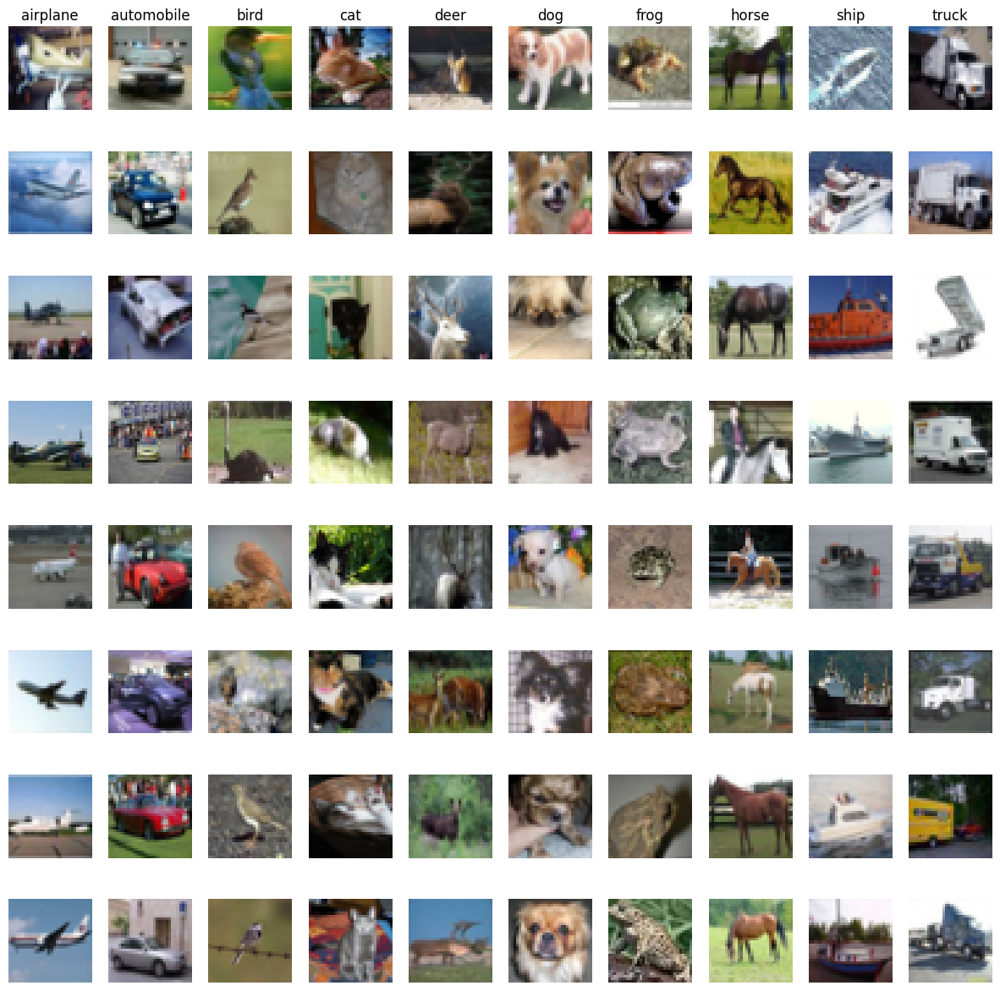

In [ ]:
"""-------------------------------------------------------------------
In this method they take 8 images at random and list them in the column to which they belong
-------------------------------------------------------------------"""
def plot_cifar10_grid():
    classes = test_loader.dataset.classes
    total_samples = 8
    plt.figure(figsize=(15,15))
    for label, sample in enumerate(classes):
        class_idxs = np.flatnonzero(label == np.array(test_loader.dataset.targets))
        sample_idxs = np.random.choice(class_idxs, total_samples, replace = False)
        for i, idx in enumerate(sample_idxs):
            plt_idx = i*len(classes) + label + 1
            plt.subplot(total_samples, len(classes), plt_idx)
            plt.imshow(test_loader.dataset.data[idx].astype(np.uint8))  # Ensure dtype is uint8
            #plt.imshow(test_loader.dataset.data[idx])
            plt.axis('off')

            if i == 0: plt.title(sample)
    plt.show()

plot_cifar10_grid()

### Calcular accuracy


In [ ]:
""""-------------------------------------------------------------------
  Function: accuracy
  Parameters:
    model (Sequential_layers): Sequential model that processes the inputs.
    loader (DataLoader):       Dataloader with batches for training or evaluation.

  Returns:
    accuracy (float): Accuracy value between 0 and 1, representing the
                      fraction of correctly classified samples.

  Description:
    This function calculates the accuracy of the model's predictions on a
    given dataset by comparing the predicted class indices to the actual
    target indices.
-------------------------------------------------------------------"""
def accuracy(model, loader):
    model.eval()  # Set the model to evaluation mode (disables dropout and batch norm effects)

    num_correct = 0  # Counter for the number of correctly classified samples
    num_total = 0  # Counter for the total number of samples

    model = model.to(device=device)  # Move the model to the specified device (CPU or GPU)

    with torch.no_grad():  # Disable gradient calculation (saves memory and improves performance)
        for xi, yi in loader:  # Iterate over the data loader (mini-batches of input and labels)
            xi = xi.to(device=device, dtype=torch.float32)  # Move input data to the device and set data type to float32
            yi = yi.to(device=device, dtype=torch.long)  # Move labels to the device and set data type to long (for classification)

            scores = model(xi)  # Forward pass: get model predictions (raw scores/logits)
            _, pred = scores.max(dim=1)  # Get the predicted class (index of max logit)

            num_correct += (pred == yi.squeeze()).sum()  # Count the number of correct predictions and increase num_correct
            num_total += pred.size(0)  # Count the total number of samples processed and

        return float(num_correct) / num_total  # Compute and return the accuracy as a float value

### Loop de entrenamiento

In [ ]:
""""-------------------------------------------------------------------
  Function: train
  Parameters:
    model (Sequential_layers):  Sequential model to train
    optimizer (Optimizer):      Optimizer tp update the parameters of a model to minimize the loss
    epochs (int):               The number of iterations over the entire training dataset (default is 100).

  Returns:
    accuracy (float): The accuracy of the model on the validation dataset
                      after the last epoch of training.

  Description:
    This function trains the provided sequential model by iterating over
    the given number of epochs. For each epoch, the model computes the loss using
    cross-entropy function.The accuracy of the model is printed
    at the end of each epoch using a validation dataset.
-------------------------------------------------------------------"""
def train(model, optimizer, epochs=100):
    model = model.to(device=device) # Move the model to the specified device (CPU or GPU)

    acc = 0
    for epoch in range(epochs):  # Iterate over the number of training epochs
        for i, (xi, yi) in enumerate(train_loader):  # Loop through mini-batches from the training data
            model.train()  # Set the model to training mode (enables dropout and batch norm updates)

            xi = xi.to(device=device, dtype=torch.float32)  # Move input data to the device and set type to float32
            yi = yi.to(device=device, dtype=torch.long)  # Move labels to the device and set type to long (for classification)

            scores = model(xi)  # Forward pass: get model predictions (logits)
            cost = F.cross_entropy(input=scores, target=yi)  # Compute the loss using cross-entropy (for classification)

            optimizer.zero_grad()  # Reset gradients to prevent accumulation from previous iterations
            cost.backward()  # Compute gradients using backpropagation
            optimizer.step()  # Update model parameters using the optimizer

        acc = accuracy(model, val_loader)  # Compute the accuracy of the model on the validation dataset
        print(f'Epoch: {epoch}, cost: {cost.item()}, accuracy: {acc}')  # Print epoch number, loss, and accuracy

    return acc

### Linear model

In this code block, we define a sequential linear neural network model, which consists of multiple fully connected layers. This architecture is particularly useful for classification tasks, where the model learns to map a set of inputs $( \mathbf{x})$ to an output $( \mathbf{y} )$, representing the classes in a high-dimensional feature space.

Mathematically, each linear layer can be expressed as a function of the form:

$$
\mathbf{y} = \mathbf{W} \cdot \mathbf{x} + \mathbf{b}
$$

where $( \mathbf{W} )$ is the weight matrix, $(\mathbf{b} )$ is the bias term, and $( \mathbf{x} )$ is the input vector. However, to enable the model to learn non-linear representations and generalize effectively, activation functions are introduced, such as ReLU, Sigmoid, or Tanh, which transform the outputs of each layer:

$$
\mathbf{a} = f(\mathbf{W} \cdot \mathbf{x} + \mathbf{b})
$$

where $( f )$ represents the activation function selected. ReLU is commonly used due to its computational efficiency and ability to mitigate the vanishing gradient problem, while Sigmoid and Tanh may be used for outputs that require normalization, such as probabilities or values within a specific range.

This model is built sequentially, meaning each layer takes the output of the previous layer as its input. The number of hidden layers and the chosen activation functions are adjusted according to the complexity of the classification problem, allowing the model to train efficiently and achieve optimal performance for specific tasks. Below is the detailed implementation of this architecture.




In [ ]:
""""-------------------------------------------------------------------
  Function: linear_model
  Parameters:
    input_size (integer)        Input size of first neuron/layer
    hidden_sizes (integer list) List of hidden linear layer output sizes
    act_list (string list)      List of activation functions to use between linear layers.
                                Must be same size as hidden_sizes.
                                Possible values:    ReLU, Sig, Tanh
    num_classes (integer)       Output size of final layer.

  Returns:
    Sequential model

  Description:
    Creates a sequential model of N linear layers followed by an activation function (if listed).
    with first layer input_size and last layer num_classes output.
-------------------------------------------------------------------"""
def linear_model(input_size, hidden_sizes, act_list, num_classes):
    layers = []
    prev_size = input_size

    layers.append(nn.Flatten()) #Converts tensor inputs to 1D tensor

    #Creates the linear layer and it function activator (if required)
    for this_hidden_size, this_activation in zip (hidden_sizes, act_list):
        layers.append(nn.Linear(prev_size, this_hidden_size)) #Set in_features (previous hidden_size) and out_features (from current hidden_size item)


        this_activation = this_activation.lower() #Set activation function to lower case for comparison
        if(this_activation == "relu"): layers.append(nn.ReLU())  #add ReLU activation function
        if(this_activation == "sig"): layers.append(nn.Sigmoid())  #add Sigmoid activation function
        if(this_activation == "tanh"): layers.append(nn.Tanh())  #add Tanh activation function

        prev_size = this_hidden_size #Save out_feature to use it as in_feature on next layer

    layers.append(nn.Linear(prev_size, num_classes))  # Final output layer with desired num_classes out_feature

    # Convert to nn.Sequential
    return nn.Sequential(*layers)

In [ ]:
model1=linear_model(32*32*3, [128, 128],["ReLU","Tanh"], 10)
optimiser = torch.optim.Adam(model1.parameters(), lr=0.0001) #Adaptive Moment Estimation

In [ ]:
# Calls the train function to train the model (model1) using the specified optimiser for 20 epochs.
train(model1, optimiser, 20)

Epoch: 0, cost: 2.1302521228790283, accuracy: 0.4022
Epoch: 1, cost: 1.596501350402832, accuracy: 0.414
Epoch: 2, cost: 1.493330478668213, accuracy: 0.413
Epoch: 3, cost: 1.6095335483551025, accuracy: 0.4092
Epoch: 4, cost: 1.459980845451355, accuracy: 0.4166
Epoch: 5, cost: 1.6400229930877686, accuracy: 0.4116
Epoch: 6, cost: 1.6046288013458252, accuracy: 0.4154
Epoch: 7, cost: 2.1717305183410645, accuracy: 0.4144
Epoch: 8, cost: 1.3500014543533325, accuracy: 0.416
Epoch: 9, cost: 1.8589550256729126, accuracy: 0.4158
Epoch: 10, cost: 1.6746302843093872, accuracy: 0.4172
Epoch: 11, cost: 1.6834278106689453, accuracy: 0.421
Epoch: 12, cost: 1.6795909404754639, accuracy: 0.4214
Epoch: 13, cost: 1.6601650714874268, accuracy: 0.419
Epoch: 14, cost: 1.5585271120071411, accuracy: 0.411
Epoch: 15, cost: 1.8101301193237305, accuracy: 0.4116
Epoch: 16, cost: 1.683677315711975, accuracy: 0.421
Epoch: 17, cost: 2.0841736793518066, accuracy: 0.415
Epoch: 18, cost: 1.9542596340179443, accuracy: 0.4

### Sequential CNN


In this code block, we implement a Convolutional Neural Network (CNN) using an object-oriented approach, which enhances flexibility and extensibility. The model inherits from `nn.Module`, ensuring compatibility with PyTorch's deep learning framework while allowing for a modular design where we can easily add or modify layers. This approach is particularly suitable for the CIFAR-10 dataset, which consists of 10 classes of 32x32 color images.

The architecture begins by defining a series of convolutional layers that perform feature extraction from the input images. Each convolutional layer is defined using `nn.Conv2d`, which applies a 2D convolution operation. The number of input channels is dynamically defined by the user through the `in_channels` argument, and the number of output channels for each layer is specified by the corresponding value in the `in_channels` list. This allows the network to learn increasingly abstract features at each layer. The convolution operation is mathematically represented as:

$$
\mathbf{y} = \mathbf{W} * \mathbf{x} + \mathbf{b}
$$

Where $( \mathbf{W})$ is the filter (kernel), $( * )$ denotes the convolution operation, and $( \mathbf{x} )$ represents the input image (or the output from the previous layer). The output of each convolutional operation is then passed through a ReLU activation function:

$$
\mathbf{a} = \text{ReLU}(\mathbf{y})
$$

The use of ReLU helps introduce non-linearity, enabling the model to learn more complex representations of the input data.

After the convolutional layers, a max-pooling layer (`nn.MaxPool2d`) is applied. Max-pooling reduces the spatial dimensions of the feature maps, effectively downsampling the data and helping to prevent overfitting by making the model less sensitive to small translations in the input image. The max-pooling operation selects the maximum value from each patch of the feature map, mathematically represented as:

$$
\mathbf{a}_{pool} = \text{MaxPool}(\mathbf{a})
$$

This reduces the spatial size of the feature maps by a factor of 2, which contributes to computational efficiency and reduces the model complexity.

The final part of the architecture consists of two fully connected (FC) layers. The output from the last convolutional layer is flattened using `nn.Flatten()`, transforming the 2D tensor into a 1D feature vector. This flattened vector is then passed through a fully connected layer (`nn.Linear`), which reduces the feature vector size to 256. The second fully connected layer reduces the feature size further to 10, corresponding to the 10 class labels in the CIFAR-10 dataset.

The final output layer has 10 units, which represent the probability distribution across the 10 classes. The number of output classes is determined by the problem at hand—in this case, the CIFAR-10 dataset, which has 10 categories. The fully connected layers are crucial for making final class predictions based on the features learned by the convolutional layers.

This CNN architecture, combining convolutional layers for automatic feature extraction, max-pooling for dimensionality reduction, and fully connected layers for classification, is well-suited to the CIFAR-10 dataset. It allows the model to learn hierarchical features, where early layers detect simple patterns like edges, and deeper layers capture more complex structures that are critical for classifying the images.


In [ ]:
"""-------------------------------------------------------------------
  Function: CNNModel

  Description:
    The CNNModel class defines a convolutional neural network (CNN) in PyTorch.
    It inherits from `nn.Module`, which provides flexibility in building neural networks.
    This class is designed to take an input image, process it through a series of convolutional layers
    with ReLU activations, and produce class predictions using fully connected layers.
    The architecture is tailored for classification tasks, such as CIFAR-10, which has 10 classes of 32x32 images.

  Parameters:
    in_channels (list): List of integers where each element represents the number of input channels for a convolutional layer
                         and the number of output channels for the next layer. The length should be at least 2.

  Returns:
    nn.Module: A CNN model with convolutional layers, max-pooling, and fully connected layers for classification.

  Components:
    - Convolutional Layers: Multiple layers defined by `in_channels`, each followed by ReLU activation.
      Uses 3x3 kernels with padding of 1.
    - Max-Pooling: A 2x2 max-pooling layer to reduce spatial dimensions.
    - Fully Connected Layers: The output is flattened and passed through two fully connected layers
      to classify the image into 10 classes (CIFAR-10).
    - Flatten: Converts the 2D feature maps to a 1D vector before passing to fully connected layers.

  Example:
    model = CNNModel([3, 32, 64, 128])  # [Input channels, hidden channels, output channels]

-------------------------------------------------------------------"""

class CNNModel(nn.Module): #Function constructor, self is the name to call the instance, it refers to the object itself, in_chanel represents the number of channels in the input volume
    def __init__(self, in_channels): #The module initializer is call
        super().__init__()
        layer_count = len(in_channels)-1

        for i in range(0, layer_count): # For each convolutional layer
            self.add_module(f'conv{i}', nn.Conv2d(in_channels = in_channels[i],
                                                out_channels = in_channels[i+1],
                                                kernel_size=3, padding = 1))

        self.max_pool = nn.MaxPool2d(2,2) # Max-pooling layer, kernel size, and the stripe is what divides the input image in half

        self.fc = nn.Linear(in_features=16*16*in_channels[layer_count], out_features=256) #Features classes numbers=256
        self.fc2 = nn.Linear(256, 10)  # CIFAR-10 has 10 output classes

        self.flatten = nn.Flatten()

    def forward(self, x):
        # Apply convolution layers
        for i in range(0, len(self._modules)-4):  # remove last 4 layers (max_pool, flatten, fc and fc2)
            x = F.relu(self._modules[f'conv{i}'](x))

        x = self.max_pool(x)
        x = self.flatten(x)
        x = self.fc(x)
        return self.fc2(x)

In [ ]:
""""-------------------------------------------------------------------
  Function: search_model
  Parameters:
    models (list of models)  Array of models to test
    epochs (int)             number of iterations to train the model (Default = 20)
    learning_rate (int)      learning rate to train the model (Default = 0.0001)

  Returns:
  tuple: (best_model, best_accuracy)
    best_model (Sequential_layers): sequential model with best accuracy
    best_accuracy (float): accuracy of best_model

  Description:
    This function trains teach sequential model and returns the best option.
    Displays the epoch, loss and accuracy per iteration.
-------------------------------------------------------------------"""
def search_model(models, epochs = 20, learning_rate = 0.0001):
    best_model = None
    best_acc = 0
    for this_model in models:
        optimiser = torch.optim.Adam(this_model.parameters(), learning_rate)
        t1 = time.perf_counter() #Save current time to calculate execution time
        acc = train(this_model, optimiser, epochs)
        t2 = time.perf_counter() # Record the time after training
        elapsed_time = (t2-t1) #Execution time

        if acc > best_acc: #If accuracy is higher than best_accuracy, save parameters
            best_acc = acc  #Update the best accuracy
            best_model = this_model

        print(f"Accuracy: {acc}, time:{elapsed_time}, Best Accuracy: {best_acc},\r\n")


    return best_model, best_acc # Return the best model and its accuracy

This code defines a list with several configurations of convolutional models (CNN) and trains them using the `search_model` function. The goal is to evaluate each model based on its accuracy and select the one that performs best after 10 epochs of training.

In [ ]:
#List of models to test
models = [CNNModel([3, 32, 64]),
         CNNModel([3, 64, 64]),
         CNNModel([3, 128, 128]),
         CNNModel([3, 128, 256]),
         CNNModel([3, 32, 64, 128]),
         CNNModel([3, 64, 128, 256])]

epochs = 10
lr = 0.0001

#Search the best model
best_model, best_accuracy = search_model(models, epochs, lr)
print(f"\n\nCon ACC={best_accuracy} el mejor modelo es:\r\n {best_model}")

Epoch: 0, cost: 1.3310391902923584, accuracy: 0.5648
Epoch: 1, cost: 1.021127700805664, accuracy: 0.6336
Epoch: 2, cost: 0.7792121767997742, accuracy: 0.648
Epoch: 3, cost: 0.7917038202285767, accuracy: 0.6756
Epoch: 4, cost: 1.167244791984558, accuracy: 0.6766
Epoch: 5, cost: 0.7582992315292358, accuracy: 0.675
Epoch: 6, cost: 1.0551397800445557, accuracy: 0.6946
Epoch: 7, cost: 0.48012903332710266, accuracy: 0.6802
Epoch: 8, cost: 0.4690633714199066, accuracy: 0.6858
Epoch: 9, cost: 0.4252810776233673, accuracy: 0.6856
Accuracy: 0.6856, time:96.3885162000006, Best Accuracy: 0.6856,

Epoch: 0, cost: 1.0752503871917725, accuracy: 0.5824
Epoch: 1, cost: 0.8891300559043884, accuracy: 0.6444
Epoch: 2, cost: 0.6351794004440308, accuracy: 0.6638
Epoch: 3, cost: 0.8272503018379211, accuracy: 0.6788
Epoch: 4, cost: 1.017345666885376, accuracy: 0.6902
Epoch: 5, cost: 0.8484175801277161, accuracy: 0.689
Epoch: 6, cost: 0.8250890374183655, accuracy: 0.6858
Epoch: 7, cost: 1.0296156406402588, acc

In [ ]:
print("Model used:\r\n",best_model,"\r\nEpochs:",epochs,"Learning rate:",lr)


val_acc = accuracy(best_model, val_loader) # Calculate the accuracy of the best model on the validation set
test_acc = accuracy(best_model, test_loader) # Calculate the accuracy of the best model on the test set

print(f'Validation Accuracy: {val_acc * 100:.2f}%')
print(f'Test Accuracy: {test_acc * 100:.2f}%') # Display the validation and test accuracy percentages

Model used:
 CNNModel(
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (max_pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc): Linear(in_features=65536, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=10, bias=True)
  (flatten): Flatten(start_dim=1, end_dim=-1)
) 
Epochs: 10 Learning rate: 0.0001
Validation Accuracy: 70.42%
Test Accuracy: 69.80%


### Conclusions


#### **Introduction**

The proposed architecture, a deep convolutional neural network, leverages the power of convolutional layers to progressively extract more complex features. This is reflected in the higher accuracy compared to traditional machine learning models, as convolutional layers are adept at identifying spatial patterns and local dependencies, which are crucial for image data.


---

#### **Results**

The results from the CNN model suggest a promising performance with:

*   Validation accuracy of **70.42%**
*   Test accuracy of **69.80%**

The model architecture, consisting of **three convolutional layers** with increasing filter sizes (64, 128, and 256), followed by a max-pooling layer and two fully connected layers, demonstrated its ability to effectively capture hierarchical spatial features from the input images, which is crucial for tasks like image classification.

By using 64, 128, and 256 filters in successive layers, the network captures both fine and abstract features from the CIFAR-10 dataset, ultimately allowing the network to make more informed classification decisions. Furthermore, the inclusion of max-pooling layers helps reduce spatial dimensions, allowing the model to focus on essential features while preventing overfitting. The fully connected layers then provide the final decision-making process, mapping the learned features into a 10-class output suitable for CIFAR-10 classification.

---

#### **Comparative Analysis**

In comparison to the:

> **Linear model**, which achieved an **accuracy** of **41.72%** on the training set

The CNN model performed significantly better. The linear model's results were lower due to the inability to capture complex patterns in the image data, as linear models are inherently limited by their assumption of linear relationships between features. The linear model struggles to model the spatial dependencies that convolutional neural networks are designed to exploit. For instance, during training, the linear model showed fluctuating performance with an accuracy ranging from **40.22%** to **41.72%**, while the:

> **CNN model** showed a much higher accuracy of **70.42%** on validation data and **69.80%** on test data.


This highlights the advantage of using convolutional networks for image classification tasks over traditional models.

---

#### **Final Conclusion**

Considering the limited number of epochs (10) and the learning rate set to **0.0001**, the results achieved by the CNN model are quite satisfactory. Given the computational time constraints and available resources, the chosen number of epochs strikes a balance between avoiding overfitting and obtaining reliable performance. Longer training times and hyperparameter tuning could potentially further improve the accuracy. However, within the time frame and resources available, the results are a strong validation of the CNN architecture's effectiveness in image classification tasks.

The CNN model's superior performance demonstrates the power of deep learning architectures in capturing complex data representations, especially for image classification tasks, compared to more traditional linear models.








Compute Unified Device Architecture or CUDA is a parallel computing platform developed by NVIDIA for general computing on GPUs (Graphics Processing Units). Some of the advantages are faster processing due parallel computing capabilities, scalability, less expensive than large CPU clusters and widespread libraries and tools to accelerate development.